In [1]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.ensemble import IsolationForest

In [2]:
df = pd.read_csv('data.csv', delimiter = '\t')
df.head()

,Q1A,Q1I,Q1E,Q2A,Q2I,Q2E,Q3A,Q3I,Q3E,Q4A,...,screensize,uniquenetworklocation,hand,religion,orientation,race,voted,married,familysize,major
0,4,28,3890,4,25,2122,2,16,1944,4,...,1,1,1,12,1,10,2,1,2,NaN
1,4,2,8118,1,36,2890,2,35,4777,3,...,2,1,2,7,0,70,2,1,4,NaN
2,3,7,5784,1,33,4373,4,41,3242,1,...,2,1,1,4,3,60,1,1,3,NaN
3,2,23,5081,3,11,6837,2,37,5521,1,...,2,1,2,4,5,70,2,1,5,biology
4,2,36,3215,2,13,7731,3,5,4156,4,...,2,2,3,10,1,10,2,1,4,Psychology


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39775 entries, 0 to 39774
Columns: 172 entries, Q1A to major
dtypes: int64(170), object(2)
memory usage: 52.2+ MB


In [4]:
df.describe()

,Q1A,Q1I,Q1E,Q2A,Q2I,Q2E,Q3A,Q3I,Q3E,Q4A,...,age,screensize,uniquenetworklocation,hand,religion,orientation,race,voted,married,familysize
count,39775.000000,39775.000000,3.977500e+04,39775.000000,39775.000000,3.977500e+04,39775.000000,39775.000000,3.977500e+04,39775.000000,...,39775.000000,39775.000000,39775.000000,39775.00000,39775.000000,39775.000000,39775.000000,39775.000000,39775.000000,39775.000000
mean,2.619485,21.555977,6.970591e+03,2.172269,21.248070,5.332376e+03,2.226097,21.583004,7.426446e+03,1.950170,...,23.612168,1.274519,1.200025,1.13516,7.555852,1.642992,31.312885,1.705795,1.159547,3.510270
std,1.032117,12.133621,8.670513e+04,1.111563,12.125288,2.651361e+04,1.038526,12.115637,1.587024e+05,1.042218,...,21.581722,0.446277,0.400024,0.40030,3.554395,1.351362,25.871272,0.473388,0.445882,2.141518
min,1.000000,1.000000,1.800000e+02,1.000000,1.000000,1.760000e+02,1.000000,1.000000,-1.081400e+04,1.000000,...,13.000000,1.000000,1.000000,0.00000,0.000000,0.000000,10.000000,0.000000,0.000000,0.000000
25%,2.000000,11.000000,2.664000e+03,1.000000,11.000000,2.477000e+03,1.000000,11.000000,2.857000e+03,1.000000,...,18.000000,1.000000,1.000000,1.00000,4.000000,1.000000,10.000000,1.000000,1.000000,2.000000
50%,3.000000,22.000000,3.609000e+03,2.000000,21.000000,3.511000e+03,2.000000,22.000000,3.898000e+03,2.000000,...,21.000000,1.000000,1.000000,1.00000,10.000000,1.000000,10.000000,2.000000,1.000000,3.000000
75%,4.000000,32.000000,5.358000e+03,3.000000,32.000000,5.216000e+03,3.000000,32.000000,5.766000e+03,3.000000,...,25.000000,2.000000,1.000000,1.00000,10.000000,2.000000,60.000000,2.000000,1.000000,4.000000
max,4.000000,42.000000,1.210228e+07,4.000000,42.000000,2.161057e+06,4.000000,42.000000,2.858269e+07,4.000000,...,1998.000000,2.000000,2.000000,3.00000,12.000000,5.000000,70.000000,2.000000,3.000000,133.000000


In [5]:
df.shape

(39775, 172)

In [6]:
print(list(df.columns))

['Q1A', 'Q1I', 'Q1E', 'Q2A', 'Q2I', 'Q2E', 'Q3A', 'Q3I', 'Q3E', 'Q4A', 'Q4I', 'Q4E', 'Q5A', 'Q5I', 'Q5E', 'Q6A', 'Q6I', 'Q6E', 'Q7A', 'Q7I', 'Q7E', 'Q8A', 'Q8I', 'Q8E', 'Q9A', 'Q9I', 'Q9E', 'Q10A', 'Q10I', 'Q10E', 'Q11A', 'Q11I', 'Q11E', 'Q12A', 'Q12I', 'Q12E', 'Q13A', 'Q13I', 'Q13E', 'Q14A', 'Q14I', 'Q14E', 'Q15A', 'Q15I', 'Q15E', 'Q16A', 'Q16I', 'Q16E', 'Q17A', 'Q17I', 'Q17E', 'Q18A', 'Q18I', 'Q18E', 'Q19A', 'Q19I', 'Q19E', 'Q20A', 'Q20I', 'Q20E', 'Q21A', 'Q21I', 'Q21E', 'Q22A', 'Q22I', 'Q22E', 'Q23A', 'Q23I', 'Q23E', 'Q24A', 'Q24I', 'Q24E', 'Q25A', 'Q25I', 'Q25E', 'Q26A', 'Q26I', 'Q26E', 'Q27A', 'Q27I', 'Q27E', 'Q28A', 'Q28I', 'Q28E', 'Q29A', 'Q29I', 'Q29E', 'Q30A', 'Q30I', 'Q30E', 'Q31A', 'Q31I', 'Q31E', 'Q32A', 'Q32I', 'Q32E', 'Q33A', 'Q33I', 'Q33E', 'Q34A', 'Q34I', 'Q34E', 'Q35A', 'Q35I', 'Q35E', 'Q36A', 'Q36I', 'Q36E', 'Q37A', 'Q37I', 'Q37E', 'Q38A', 'Q38I', 'Q38E', 'Q39A', 'Q39I', 'Q39E', 'Q40A', 'Q40I', 'Q40E', 'Q41A', 'Q41I', 'Q41E', 'Q42A', 'Q42I', 'Q42E', 'country', 'source

In [7]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

valores_fila = df.loc[11397] # Ver valores de un id concreto
print(valores_fila)

Q1A                                       2
Q1I                                      42
Q1E                                    1868
Q2A                                       3
Q2I                                      31
Q2E                                    2286
Q3A                                       4
Q3I                                      29
Q3E                                    1845
Q4A                                       3
Q4I                                      28
Q4E                                    3174
Q5A                                       4
Q5I                                      30
Q5E                                    1615
Q6A                                       3
Q6I                                       6
Q6E                                    1912
Q7A                                       1
Q7I                                      19
Q7E                                    3517
Q8A                                       4
Q8I                             

Tiempos de Respuesta

In [8]:
columnas_tiempo = [f'Q{i}E' for i in range(1, 43)]

tiempo_medio = df[columnas_tiempo].mean() # Media tiempo respuesta para cada pregunta
desviacion_estandar_tiempo = df[columnas_tiempo].std() # Desviación estándar para cada pregunta
suma_media = tiempo_medio.sum() # Tiempo de respuesta total para las preguntas

print(f'Tiempo medio por pregunta (minutos):\n {tiempo_medio/60000}')
print(f'Desviación estándar de tiempo por pregunta (minutos):\n {desviacion_estandar_tiempo/60000}')
print(f'Suma media (minutos):\n {suma_media/60000}')

Tiempo medio por pregunta (minutos):
 Q1E     0.116177
Q2E     0.088873
Q3E     0.123774
Q4E     0.118812
Q5E     0.098655
Q6E     0.095402
Q7E     0.162950
Q8E     0.074077
Q9E     0.305514
Q10E    0.152625
Q11E    0.091503
Q12E    0.109508
Q13E    0.065531
Q14E    0.172479
Q15E    0.087393
Q16E    0.107446
Q17E    0.086632
Q18E    0.121559
Q19E    0.187408
Q20E    0.082758
Q21E    0.093271
Q22E    0.114418
Q23E    0.076722
Q24E    0.135716
Q25E    0.234715
Q26E    0.088949
Q27E    0.140801
Q28E    0.136395
Q29E    0.141559
Q30E    0.161985
Q31E    0.117829
Q32E    0.212033
Q33E    0.087871
Q34E    0.081195
Q35E    0.235098
Q36E    0.072262
Q37E    0.113517
Q38E    0.097302
Q39E    0.141202
Q40E    0.171235
Q41E    0.092345
Q42E    0.138345
dtype: float64
Desviación estándar de tiempo por pregunta (minutos):
 Q1E      1.445086
Q2E      0.441894
Q3E      2.645039
Q4E      1.266414
Q5E      1.071368
Q6E      0.836597
Q7E      7.379313
Q8E      0.381936
Q9E     23.495407
Q10E     6.97725

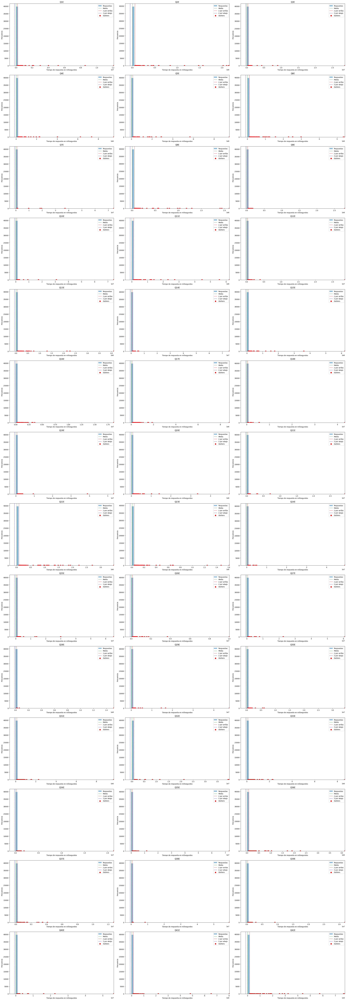

In [9]:
umbral_desviacion = 2

fig, axes = plt.subplots(nrows = 14, ncols = 3, figsize = (30, 90))

for i, col in enumerate(columnas_tiempo):
    row = i // 3
    num_col = i % 3
    ax = axes[row, num_col]
    
    df[col].plot(kind = 'hist', bins = 50, alpha = 0.5, label = 'Respuestas', ax = ax)
    ax.axvline(tiempo_medio[col], color = 'green', linestyle = 'dashed', linewidth = 1, label = 'Media')
    ax.axvline(tiempo_medio[col] + umbral_desviacion * desviacion_estandar_tiempo[col], color = 'red', linestyle = 'dashed', linewidth = 1, label = f'{umbral_desviacion} por arriba')
    ax.axvline(tiempo_medio[col] - umbral_desviacion * desviacion_estandar_tiempo[col], color = 'blue', linestyle = 'dashed', linewidth = 1, label = f'{umbral_desviacion} por abajo')
    
    # Outliers
    limite_superior = tiempo_medio[col] + umbral_desviacion * desviacion_estandar_tiempo[col]
    limite_inferior = tiempo_medio[col] - umbral_desviacion * desviacion_estandar_tiempo[col]
    outliers = df[(df[col] > limite_superior) | (df[col] < limite_inferior)][col]
    ax.scatter(outliers, [0] * len(outliers), color = 'red', s = 50, label = 'Outliers')
    
    ax.set_title(f'{col}')
    ax.set_xlabel('Tiempo de respuesta en milisegundos') # Creo que el tiempo es en segundos pero no estoy segura porque las columnas están en milisegundos y no entiendo porque salen valores tan bajo si no los he modificado
    ax.set_ylabel('Frecuencia')
    ax.set_xlim(right = df[col].max()) # Muestra hasta los últimos valores del eje X hacia la derecha
    ax.legend()
    
plt.tight_layout(rect = [0, 0, 1, 0.96])
plt.show()

In [10]:
# Imprimir valores outliers y sus detalles
for col in columnas_tiempo:
    limites_superior = tiempo_medio[col] + umbral_desviacion * desviacion_estandar_tiempo[col]
    limites_inferior = tiempo_medio[col] - umbral_desviacion * desviacion_estandar_tiempo[col]
    outliers = df[(df[col] > limites_superior) | (df[col] < limites_inferior)]
    if not outliers.empty:
        print(f'Outliers en la columna {col}:')
        print(outliers[[col]])

Outliers en la columna Q1E:
            Q1E
124      197833
887      595299
1089     712916
1246     416106
1529    1629733
3982     280846
4719     245224
4936     532865
5262     280447
6928     182248
7031     202351
7730     180912
7972     643479
8868    4008973
9064     544239
9372     321658
9430     425221
10833    691198
10917    571959
11332    256775
13018    204668
13675    376010
14766    205035
16268    602174
18093    206188
18604    271609
20931   2032849
21722   1213731
22203    207322
22216   2161799
22306    307948
23943    257852
25449    185916
25787    187784
26450    199414
27451   1101981
28022    263518
29522    264423
30955   3000000
31481    320478
31685    238664
32207    367745
32569    317196
34864    426638
35167   5218571
35263    743561
35267  12102282
35275    268962
35465    390968
36496   8549589
36713   2100037
37401    845559
Outliers en la columna Q2E:
           Q2E
223      95645
317      95468
464     126646
898      65676
1303     64271
1622  

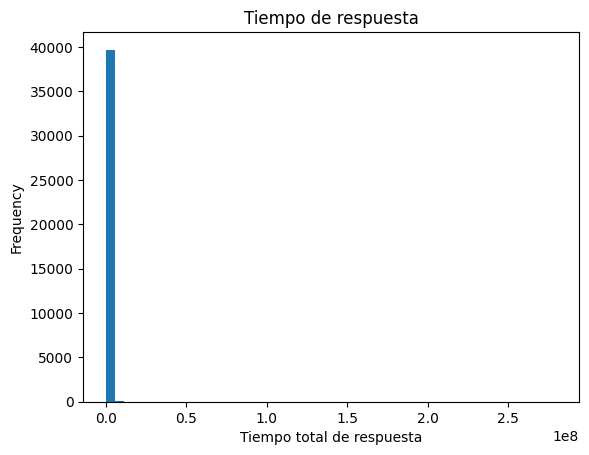

In [11]:
# Combinar columnas de tiempo de respuesta en una
columnas_tiempo = [f'Q{i}E' for i in range(1, 43)]
df['tiempo_total_respuesta'] = df[columnas_tiempo].sum(axis = 1)

df['tiempo_total_respuesta'].plot(kind = 'hist', bins = 50)
plt.title('Tiempo de respuesta')
plt.xlabel('Tiempo total de respuesta')
plt.show()

In [12]:
df[columnas_tiempo].mean() # Milisegundos

Q1E      6970.590798
Q2E      5332.375839
Q3E      7426.446084
Q4E      7128.728422
Q5E      5919.305946
Q6E      5724.097423
Q7E      9776.971263
Q8E      4444.626952
Q9E     18330.829239
Q10E     9157.493652
Q11E     5490.151578
Q12E     6570.469315
Q13E     3931.871779
Q14E    10348.746851
Q15E     5243.594142
Q16E     6446.743407
Q17E     5197.917762
Q18E     7293.520075
Q19E    11244.458378
Q20E     4965.477335
Q21E     5596.289554
Q22E     6865.094305
Q23E     4603.325229
Q24E     8142.970132
Q25E    14082.904789
Q26E     5336.940138
Q27E     8448.038894
Q28E     8183.670195
Q29E     8493.555525
Q30E     9719.104513
Q31E     7069.761282
Q32E    12721.997385
Q33E     5272.239145
Q34E     4871.684224
Q35E    14105.870572
Q36E     4335.748460
Q37E     6811.022954
Q38E     5838.114268
Q39E     8472.124073
Q40E    10274.099761
Q41E     5540.696216
Q42E     8300.695211
dtype: float64

Verificación de Respuestas a Palabras No Reales (VCL)

In [13]:
palabras_falsas = ['VCL6', 'VCL9', 'VCL12']
df['recuento_palabras_falsas'] = df[palabras_falsas].sum(axis = 1)

respuestas_sospechosas = df[df['recuento_palabras_falsas'] > 0]
print(respuestas_sospechosas[['recuento_palabras_falsas'] + palabras_falsas])

       recuento_palabras_falsas  VCL6  VCL9  VCL12
7                             1     1     0      0
8                             1     1     0      0
14                            1     0     0      1
15                            1     0     1      0
22                            1     1     0      0
25                            1     0     1      0
26                            2     0     1      1
31                            2     1     0      1
33                            1     0     0      1
42                            1     0     0      1
55                            1     0     0      1
56                            1     0     0      1
57                            2     0     1      1
67                            1     0     0      1
68                            1     0     0      1
70                            1     0     0      1
72                            1     0     1      0
73                            1     0     0      1
74                            1

Respuestas extremas

In [14]:
# Contar respuestas extremas (todas las respuestas en 1 o 4)
respuestas_extremas = df[(df[['Q21A', 'Q38A', 'Q3A', 'Q4A']] == 1).sum(axis = 1) >= 3]
print(respuestas_extremas[['Q1A', 'Q2A', 'Q3A', 'Q4A']])

       Q1A  Q2A  Q3A  Q4A
3        2    3    2    1
7        1    1    1    1
13       1    4    1    2
14       1    1    1    1
20       3    1    2    1
27       2    2    1    2
32       2    2    1    1
33       2    1    2    1
39       2    1    1    1
40       1    1    1    1
46       1    2    1    1
54       1    1    1    1
56       2    1    1    1
59       2    1    1    1
60       1    1    1    1
61       2    2    3    1
63       1    1    2    1
64       3    1    4    1
66       1    2    1    1
69       3    1    1    1
70       3    1    2    1
74       2    1    1    4
76       1    1    1    1
80       1    1    1    1
83       3    2    1    1
89       1    1    1    1
92       2    1    1    1
99       1    1    1    1
100      1    1    1    1
102      1    2    1    1
104      2    1    2    1
106      1    1    2    1
108      1    1    1    2
118      3    3    1    1
124      1    2    1    1
127      3    1    1    1
131      1    1    2    1
132      1  

Consistencia Interna

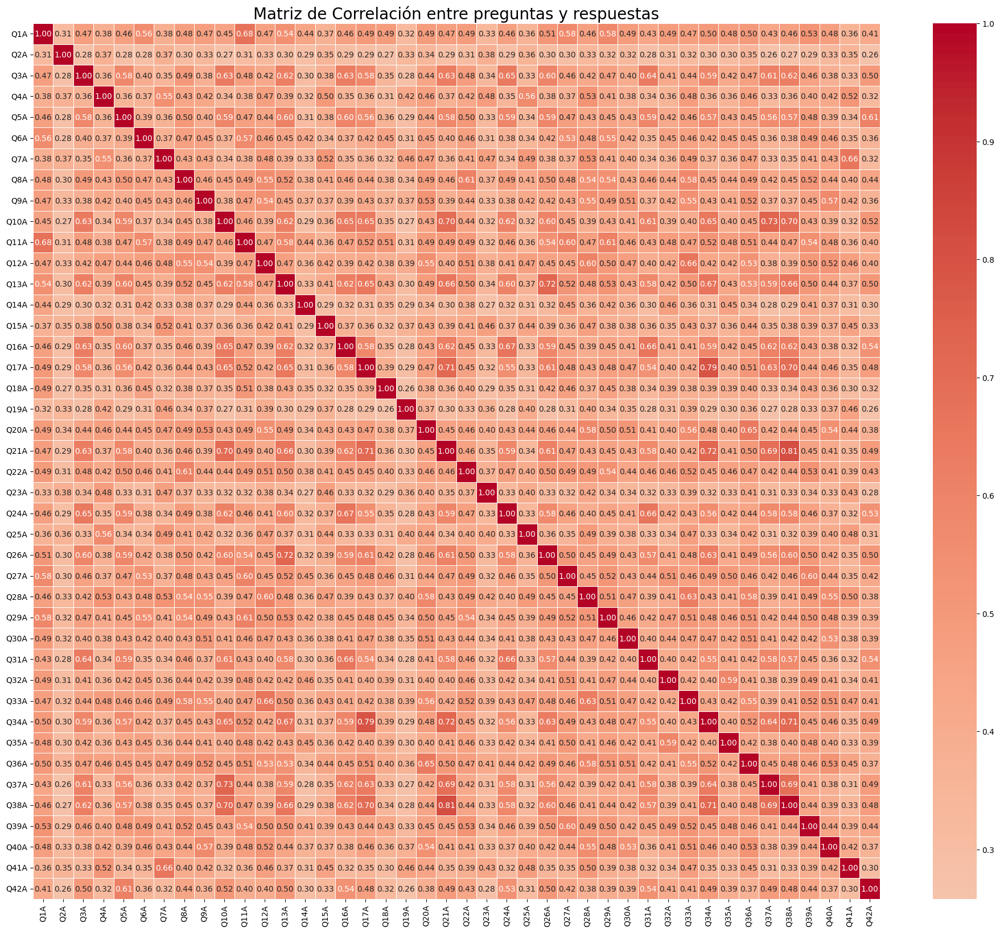

In [15]:
columnas_preguntas = [f'Q{i}A' for i in range(1, 43)]

df_seleccionado = df[columnas_preguntas]

matriz_correlacion = df_seleccionado.corr()

plt.figure(figsize = (24, 20))
sns.heatmap(matriz_correlacion, cmap = 'coolwarm', annot = True, fmt = '.2f', linewidths = 0.5, center = 0)

plt.title('Matriz de Correlación entre preguntas y respuestas', fontsize = 20)
plt.xticks(fontsize = 10)
plt.yticks(fontsize = 10)
plt.show()

In [17]:
# Considera como relacionadas las que tengan un umbral de correlación de 0.6
umbral_correlacion = 0.6

# Busca los pares de preguntas que se relacionan entre ellas
pares_relacionados = []
for i in range(len(columnas_preguntas)):
    for j in range(i + 1, len(columnas_preguntas)):
        if abs(matriz_correlacion.iloc[i, j]) >= umbral_correlacion:
            pares_relacionados.append((columnas_preguntas[i], columnas_preguntas[j]))

# Creación de una matriz sólo con las preguntas relacionadas
matriz_correlacion_filtrada = matriz_correlacion.copy()
for i in range(len(columnas_preguntas)):
    for j in range(len(columnas_preguntas)):
        if (columnas_preguntas[i], columnas_preguntas[j]) not in pares_relacionados and (columnas_preguntas[j], columnas_preguntas[i]) not in pares_relacionados:
            matriz_correlacion_filtrada.iloc[i, j] = 0

# Filtro para las respuestas contradictorias (resultado 1 y 4)
inconsistencias = []
for (pregunta1, pregunta2) in pares_relacionados:
    respuestas_contradicciones = df_seleccionado[
        ((df_seleccionado[pregunta1] == 1) & (df_seleccionado[pregunta2] == 4)) |
        ((df_seleccionado[pregunta1] == 4) & (df_seleccionado[pregunta2] == 1))
    ]

    if not respuestas_contradicciones.empty:
        inconsistencias.append({
            'pregunta1': pregunta1,
            'pregunta2': pregunta2,
            'respuestas_contradicciones': respuestas_contradicciones
        })

for inconsistencia in inconsistencias:
    print(f'Inconsistencias entre {inconsistencia["pregunta1"]} y {inconsistencia["pregunta2"]}:')
    print(inconsistencia['respuestas_contradicciones'])

Inconsistencias entre Q1A y Q11A:
       Q1A  Q2A  Q3A  Q4A  Q5A  Q6A  Q7A  Q8A  Q9A  Q10A  Q11A  Q12A  Q13A  \
107      1    2    2    1    3    4    1    3    2     2     4     2     4   
183      4    4    4    1    2    3    1    2    4     4     1     1     4   
239      1    3    4    2    3    1    3    2    4     4     4     4     4   
253      1    3    4    2    2    3    2    2    1     2     4     2     4   
533      1    1    1    1    3    2    1    1    2     3     4     1     1   
708      1    2    2    2    2    4    4    3    3     1     4     3     2   
1172     1    4    3    4    3    1    3    4    3     4     4     3     4   
1285     1    3    3    2    4    2    2    2    3     4     4     2     4   
1455     1    1    2    4    2    4    1    2    4     4     4     1     4   
1478     4    1    1    3    3    3    1    4    2     3     1     3     4   
1646     1    2    4    3    2    4    4    4    4     4     4     4     4   
1647     4    3    1    1    3

In [20]:
# Comparar respuestas a preguntas relacionadas
correlacion = df[['Q38A', 'Q21A']].corr().iloc[0, 1]
print(f'Correlación entre Q38A y Q21A: {correlacion}')

Correlación entre Q38A y Q21A: 0.8137130591257271


In [21]:
correlacion = df[['Q38A', 'Q21A']].corr()
print(f'Correlación entre Q38A y Q21A: {correlacion}')

Correlación entre Q38A y Q21A:           Q38A      Q21A
Q38A  1.000000  0.813713
Q21A  0.813713  1.000000


 Coherencia con Datos Demográficos

In [57]:
incoherencias_edad_educacion = df[(df['age'] < 18) & (df['education'] > 2)]
print(incoherencias_edad_educacion[['age', 'education']])
print(f'Número de registros: {len(incoherencias_edad_educacion)}')

       age  education
132     14          3
1434    17          4
1519    14          4
1698    17          3
2229    17          4
2616    17          3
3685    16          3
3947    17          4
6812    17          3
8691    13          3
8778    17          3
12367   15          3
12509   13          3
12846   16          4
13944   17          3
15322   15          4
15649   15          3
15650   15          3
18840   17          3
19467   17          3
19723   17          3
25089   17          3
25921   15          3
26680   17          3
29285   17          3
31524   17          3
32841   17          3
34777   15          4
35160   17          3
35231   16          3
Número de registros: 30


In [58]:
incoherencias_edad_voto = df[(df['age'] < 18) & (df['voted'] == 1)]
print(incoherencias_edad_voto[['age', 'education']])
print(f'Número de registros: {len(incoherencias_edad_voto)}')

       age  education
2       17          2
383     17          2
676     17          2
1279    15          1
1283    16          1
2822    16          2
3173    17          2
3184    15          1
3598    15          2
4430    14          1
5229    16          2
6323    16          2
6395    14          2
6747    17          2
6772    17          2
6931    15          1
6935    17          0
7155    16          2
7244    15          2
7364    16          2
7605    17          2
7710    16          2
8686    14          2
9036    17          2
9076    17          2
9257    16          1
9709    16          2
10763   17          2
11220   16          1
11388   14          2
12468   16          1
13513   14          1
13964   17          2
18459   17          2
18615   17          1
20518   16          2
20808   16          1
21330   16          2
21434   15          0
23109   17          2
23369   13          1
23931   17          2
23983   16          2
24661   14          1
25841   17

Detección de Anomalías con IsolationForest

In [63]:
X = df[columnas_tiempo].values

model = IsolationForest(contamination = 0.1, random_state = 42)
df['anomaly'] = model.fit_predict(X) # -1 indica anomalías y 1 indica obsevaciones normales

anomalias = df[df['anomaly'] == -1] 

print(anomalias[['anomaly'] + columnas_tiempo])

# anomalias.to_csv('anomalias_detectadas.csv', index = False)

       anomaly      Q1E      Q2E      Q3E      Q4E      Q5E      Q6E  \
6           -1     4325     4009     3604     4826     2842     2342   
50          -1    31745     3287     1044    15144     3777    10450   
55          -1     3814     2943     3079     3243     1752     4445   
57          -1     3827     6293    12153    27819     3677     5148   
62          -1     7482     3868     4001     5136     3252     2937   
67          -1     2072     2112     2480     1824     1728     4040   
71          -1     2921     5994   132096    20825     3040     2205   
85          -1     3384     4365    10174     6449   102986     3883   
96          -1     2342     3204   108458     6552     3217     2267   
106         -1     4514     4707     5914     5998    20306     3868   
107         -1    11761     8183    79523     5345     5396     3184   
111         -1    46275     4035    11974     5210    35466    28291   
113         -1     5450     5232     8467     5948     9166     